In [1]:
import netCDF4 as nc
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import scipy
import tqdm
import matplotlib.colors as mcolors
from helpers import process_h as helper
from helpers import visualize_h as vis_helper
import skill_metrics as sm
import pysteps

Pysteps configuration file found at: /root/.pyenv/versions/3.10.11/envs/dsproj/lib/python3.10/site-packages/pysteps/pystepsrc



In [2]:
data_relative_path = os.path.join('..', 'Data')
precipitation_path = os.path.join(data_relative_path,'CMIP6','Precipitation')
WTIO_path = os.path.join(data_relative_path,'CMIP6','WTIO')
SEIO_path = os.path.join(data_relative_path,'CMIP6','SEIO')
CHIRPS_path = os.path.join(data_relative_path,'CHIRPS2')
SLP_path = os.path.join(data_relative_path,'CMIP6','SLP')
GPH500_path = os.path.join(data_relative_path,'CMIP6', 'GPH500')

In [3]:
dmi_baseline = scipy.io.loadmat(f"{data_relative_path}/DMI/DMI.mat")['DMI_Oct_1981_2022'][:, 1][:30]

In [4]:
precip_baseline = ((nc.Dataset(f"{CHIRPS_path}/CHIRPS_Monthly_precipitation.nc")['precip'][:])[9::12, 280:360, 800:920])[:30, :, :]

In [5]:
# Converting units needed for converting models precipitation measurements
unit_conversion = 86400 * 31
# Map latitude and longitude boundaries
bounds_middle_east_lat = [20, 40]
bounds_middle_east_lon = [20, 50]
boundaries_middle_east = bounds_middle_east_lon + bounds_middle_east_lat
bounds_general_lat = [-20, 50]
bounds_general_lon = [-10, 110]
boundaries_general = bounds_general_lon + bounds_general_lat
# A dimension we want our grid to have
dim = (16, 16)
chirps_dim = precip_baseline.shape[1], precip_baseline.shape[2]

First we need to load the data.

In [6]:
wtio = helper.collect_all_datasets(WTIO_path, 'wtio')
seio = helper.collect_all_datasets(SEIO_path, 'seio')

  0%|                                                                                            | 0/24 [00:00<?, ?it/s]

tos_Omon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
tos_Omon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
tos_Omon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc


 17%|██████████████                                                                      | 4/24 [00:00<00:02,  8.36it/s]

tos_Omon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
tos_Omon_CNRM-CM6-1-HR_historical_r1i1p1f2_gn_19811016-20101016_v20191021.nc
tos_Omon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190826.nc


 33%|████████████████████████████                                                        | 8/24 [00:01<00:02,  6.00it/s]

tos_Omon_EC-Earth3-AerChem_historical_r1i1p1f1_gn_19811016-20101016_v20200624.nc
tos_Omon_FGOALS-f3-L_historical_r1i1p1f1_gn_19811016-20101016_v20191007.nc


 42%|██████████████████████████████████▌                                                | 10/24 [00:01<00:02,  6.12it/s]

tos_Omon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191122.nc
tos_Omon_GFDL-ESM4_historical_r1i1p1f1_gr_19811016-20101016_v20190726.nc
tos_Omon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc


 54%|████████████████████████████████████████████▉                                      | 13/24 [00:01<00:01,  9.61it/s]

tos_Omon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
tos_Omon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20200915.nc
tos_Omon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc


 62%|███████████████████████████████████████████████████▉                               | 15/24 [00:01<00:00,  9.27it/s]

tos_Omon_IPSL-CM6A-LR_historical_r1i1p1f1_gn_19811016-20101016_v20180803.nc
tos_Omon_MCM-UA-1-0_historical_r0i0p0f2_gn_19811017-20101017_v20190731.nc


 71%|██████████████████████████████████████████████████████████▊                        | 17/24 [00:02<00:00,  8.86it/s]

tos_Omon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc


 88%|████████████████████████████████████████████████████████████████████████▋          | 21/24 [00:02<00:00, 10.98it/s]

tos_Omon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
tos_Omon_MRI-ESM2-0_historical_r1i1p1f1_gr_19811016-20101016_v20190904.nc
tos_Omon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190703.nc
tos_Omon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc


 96%|███████████████████████████████████████████████████████████████████████████████▌   | 23/24 [00:02<00:00,  8.70it/s]

tos_Omon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
tos_Omon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200630.nc


100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:02<00:00,  8.26it/s]


tos_Omon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190627.nc


 17%|██████████████                                                                      | 4/24 [00:00<00:00, 26.60it/s]

tos_Omon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
tos_Omon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
tos_Omon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
tos_Omon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
tos_Omon_CNRM-CM6-1-HR_historical_r1i1p1f2_gn_19811016-20101016_v20191021.nc
tos_Omon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190826.nc
tos_Omon_EC-Earth3-AerChem_historical_r1i1p1f1_gn_19811016-20101016_v20200624.nc


 71%|██████████████████████████████████████████████████████████▊                        | 17/24 [00:00<00:00, 52.27it/s]

tos_Omon_FGOALS-f3-L_historical_r1i1p1f1_gn_19811016-20101016_v20191007.nc
tos_Omon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191122.nc
tos_Omon_GFDL-ESM4_historical_r1i1p1f1_gr_19811016-20101016_v20190726.nc
tos_Omon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
tos_Omon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
tos_Omon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20200915.nc
tos_Omon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
tos_Omon_IPSL-CM6A-LR_historical_r1i1p1f1_gn_19811016-20101016_v20180803.nc
tos_Omon_MCM-UA-1-0_historical_r0i0p0f2_gn_19811017-20101017_v20190731.nc
tos_Omon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
tos_Omon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
tos_Omon_MRI-ESM2-0_historical_r1i1p1f1_gr_19811016-20101016_v20190904.nc


100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 44.27it/s]

tos_Omon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190703.nc
tos_Omon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
tos_Omon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
tos_Omon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200630.nc
tos_Omon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190627.nc


In [7]:
options = {"interpolate": True,
           "force grid": False,
           "average": False}

In [8]:
precip  = helper.collect_all_datasets(precipitation_path, 'precip', chirps_dim, unit_conversion, bounds_middle_east_lat, bounds_middle_east_lon, options)

  0%|                                                                                            | 0/24 [00:00<?, ?it/s]

pr_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(30, 16, 16)


  8%|███████                                                                             | 2/24 [00:00<00:04,  4.85it/s]

pr_Amon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
(30, 18, 27)
pr_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
(30, 7, 10)


 12%|██████████▌                                                                         | 3/24 [00:00<00:04,  4.37it/s]

pr_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
(30, 21, 25)


 17%|██████████████                                                                      | 4/24 [00:00<00:05,  3.94it/s]

pr_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc
(30, 40, 61)


 21%|█████████████████▌                                                                  | 5/24 [00:01<00:06,  2.91it/s]

pr_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190913.nc
(30, 20, 30)


 25%|█████████████████████                                                               | 6/24 [00:01<00:05,  3.13it/s]

pr_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
(30, 28, 43)


 29%|████████████████████████▌                                                           | 7/24 [00:02<00:05,  3.08it/s]

pr_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
(30, 20, 24)


 33%|████████████████████████████                                                        | 8/24 [00:02<00:04,  3.24it/s]

pr_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191209.nc
(30, 21, 25)


 38%|███████████████████████████████▌                                                    | 9/24 [00:02<00:04,  3.46it/s]

pr_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
(30, 20, 24)


 42%|██████████████████████████████████▌                                                | 10/24 [00:02<00:04,  3.49it/s]

pr_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
(30, 10, 12)


 46%|██████████████████████████████████████                                             | 11/24 [00:03<00:03,  3.64it/s]

pr_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
(30, 16, 16)


 50%|█████████████████████████████████████████▌                                         | 12/24 [00:03<00:03,  3.34it/s]

pr_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
(30, 10, 16)


 54%|████████████████████████████████████████████▉                                      | 13/24 [00:03<00:03,  3.49it/s]

pr_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
(30, 14, 16)


 62%|███████████████████████████████████████████████████▉                               | 15/24 [00:04<00:02,  3.91it/s]

pr_Amon_IPSL-CM6A-LR_historical_r1i1p1f1_gr_19811016-20101016_v20180803.nc
(30, 16, 13)


 67%|███████████████████████████████████████████████████████▎                           | 16/24 [00:04<00:01,  4.07it/s]

pr_Amon_MCM-UA-1-0_historical_r1i1p1f2_gn_19811017-20101017_v20191017.nc
(30, 9, 8)


 71%|██████████████████████████████████████████████████████████▊                        | 17/24 [00:04<00:01,  4.22it/s]

pr_Amon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
(30, 15, 21)
pr_Amon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
(30, 22, 32)


 79%|█████████████████████████████████████████████████████████████████▋                 | 19/24 [00:05<00:01,  4.29it/s]

pr_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_19811016-20101016_v20190222.nc
(30, 18, 27)


 83%|█████████████████████████████████████████████████████████████████████▏             | 20/24 [00:05<00:00,  4.40it/s]

pr_Amon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190630.nc
(30, 10, 16)


 88%|████████████████████████████████████████████████████████████████████████▋          | 21/24 [00:05<00:00,  4.51it/s]

pr_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(30, 21, 25)
pr_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc


 92%|████████████████████████████████████████████████████████████████████████████       | 22/24 [00:05<00:00,  4.56it/s]

(30, 21, 25)
pr_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc
(30, 21, 25)


100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:06<00:00,  3.90it/s]

pr_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190406.nc
(30, 16, 16)


In [9]:
lats, lons = {key: val[1] for key, val in precip.items()}, {key: val[2] for key, val in precip.items()}
precip = {key: val[0] for key, val in precip.items()}

In [10]:
masked_precip = {key: np.ma.array(val, mask=precip_baseline.mask) for key, val in precip.items()}

In [11]:
dmi = helper.calc_dmi(wtio, seio, 'anomaly grid - mean first')

100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 74.11it/s]


In [12]:
corrs = dict()

for key in tqdm.tqdm(masked_precip.keys()):
    corr_mat = helper.calc_dmi_precp_corr_vec(dmi[key], masked_precip[key])
    corrs[key] = corr_mat

100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 92.86it/s]


In [13]:
alpha = 0.05
tested_corrs = {key: np.where(helper.calc_corr_t_test(corr_map) > alpha, 0, corr_map) for key, corr_map in corrs.items()}

In [14]:
corr_baseline = helper.calc_dmi_precp_corr_vec(dmi_baseline, precip_baseline)
tested_corr_baseline = np.where(helper.calc_corr_t_test(corr_baseline) > alpha, 0, corr_baseline)

# With T-test

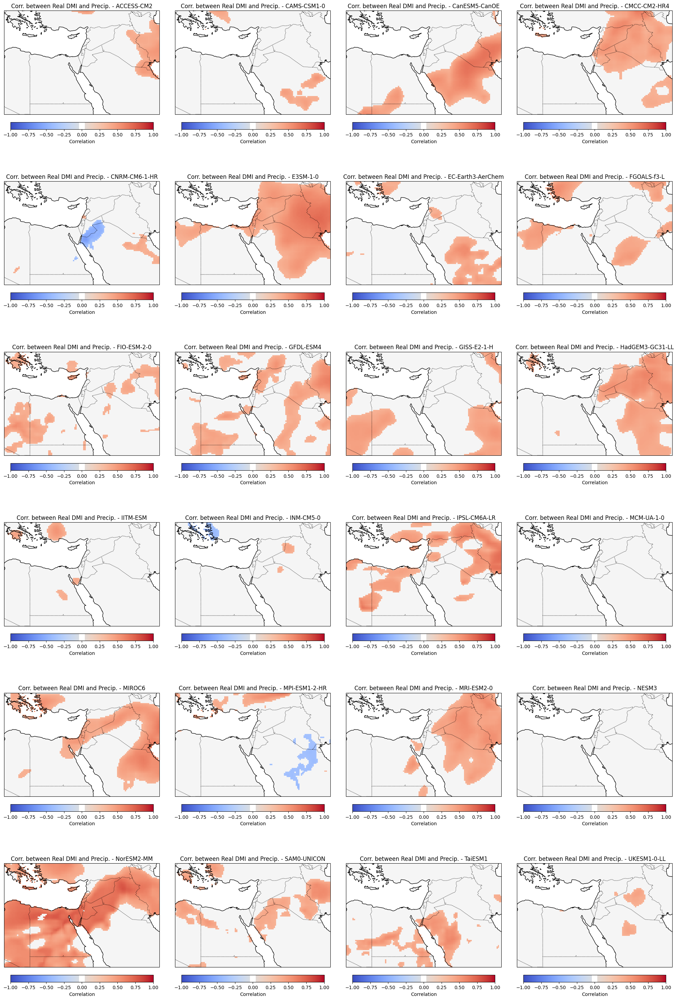

In [15]:
fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(tested_corrs.values())
titles = list(tested_corrs.keys())


for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_corr_heatmap_rigid(ax, value, boundaries_middle_east, 'Correlation between DMI and Precipitation', f'Corr. between Real DMI and Precip. - {key}', 0)
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

lets look at the real correlation

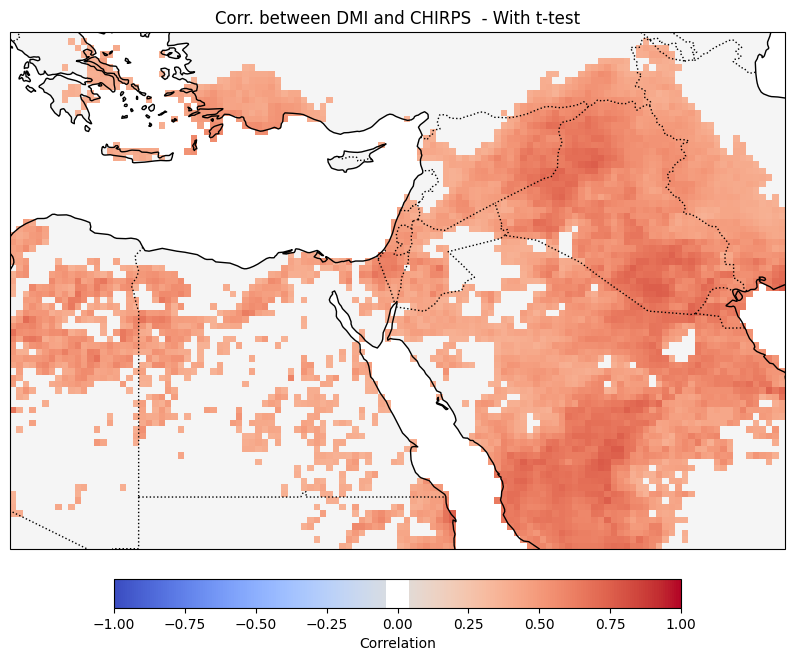

In [16]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
vis_helper.plot_corr_heatmap_rigid(ax, tested_corr_baseline, boundaries_middle_east, 'Correlation between DMI and Precipitation', 'Corr. between DMI and CHIRPS  - With t-test', 0)


# Without T-Test

In [17]:
# fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
# fig.tight_layout()
# mats = list(corrs.values())
# titles = list(corrs.keys())


# for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_corr_heatmap_rigid(ax, value, boundaries_middle_east, 'Correlation between DMI and Precipitation', f'Corr. between Real DMI and Precip. - {key}', 0)
# plt.subplots_adjust(wspace=0.1, hspace=0.1)
# plt.show()

Again, real correlation for comparison

In [18]:
# fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
# vis_helper.plot_corr_heatmap_rigid(ax, corr_baseline, boundaries_middle_east, 'Correlation between DMI and Precipitation', 'Corr. between DMI and CHIRPS - Without t-test', 0)


In [19]:
avg_corrs = np.array([np.nanmean(corr_map) for key, corr_map in tested_corrs.items()])

In [20]:
stds = np.array([np.nanstd(dmi_arr) for key, dmi_arr in dmi.items()])

In [21]:
baseline_sd = np.nanstd(dmi_baseline)

In [22]:
avg_corr_baseline = np.mean(tested_corr_baseline)

In [23]:
rmsds = []
for key, dmi_arr in dmi.items():
    rmsds.append(sm.centered_rms_dev(dmi_arr, dmi_baseline))
    
rmsds = np.array(rmsds)

In [24]:
labels = list(corrs.keys())

In [25]:
avg_corrs = np.array([avg_corr_baseline] + avg_corrs.tolist())
stds = np.array ([baseline_sd] + stds.tolist()) # [baseline_sd].extend(stds)
rmsds = np.array([0] + rmsds.tolist()) #[0].extend(rmsds)
labels = ['Baseline'] + labels

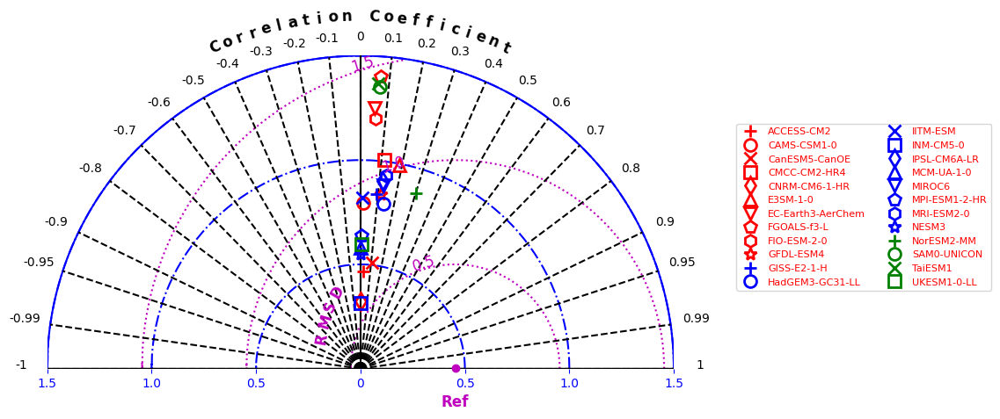

In [26]:
fig, ax = plt.subplots(figsize=(15, 6))
sm.taylor_diagram(stds, rmsds, avg_corrs, markerLabel = labels, markerLegend = 'on',
                  markerLabelColor = 'r', 
                  colRMS = 'm', styleRMS = ':', 
                  colSTD = 'b', styleSTD = '-.', 
                  colCOR = 'k', styleCOR = '--',
                 markerobs = 'o', titleOBS = 'Ref',
                  titleSTD ='on',
                 alpha = 0)

In [27]:
for i, key in enumerate(labels):
    print(f"AVG. Correlation in Model {key} - {round(avg_corrs[i], 2)}")

AVG. Correlation in Model Baseline - 0.23
AVG. Correlation in Model ACCESS-CM2 - 0.03
AVG. Correlation in Model CAMS-CSM1-0 - 0.02
AVG. Correlation in Model CanESM5-CanOE - 0.11
AVG. Correlation in Model CMCC-CM2-HR4 - 0.11
AVG. Correlation in Model CNRM-CM6-1-HR - -0.0
AVG. Correlation in Model E3SM-1-0 - 0.19
AVG. Correlation in Model EC-Earth3-AerChem - 0.05
AVG. Correlation in Model FGOALS-f3-L - 0.07
AVG. Correlation in Model FIO-ESM-2-0 - 0.06
AVG. Correlation in Model GFDL-ESM4 - 0.11
AVG. Correlation in Model GISS-E2-1-H - 0.09
AVG. Correlation in Model HadGEM3-GC31-LL - 0.14
AVG. Correlation in Model IITM-ESM - 0.01
AVG. Correlation in Model INM-CM5-0 - -0.0
AVG. Correlation in Model IPSL-CM6A-LR - 0.12
AVG. Correlation in Model MCM-UA-1-0 - 0.0
AVG. Correlation in Model MIROC6 - 0.12
AVG. Correlation in Model MPI-ESM1-2-HR - 0.0
AVG. Correlation in Model MRI-ESM2-0 - 0.13
AVG. Correlation in Model NESM3 - 0.0
AVG. Correlation in Model NorESM2-MM - 0.3
AVG. Correlation in Mode

In [28]:
max_corrs = np.array([np.nanmax(corr_map) for key, corr_map in tested_corrs.items()])
max_corr_baseline = np.max(tested_corr_baseline)
max_corrs = np.array([max_corr_baseline] + max_corrs.tolist())


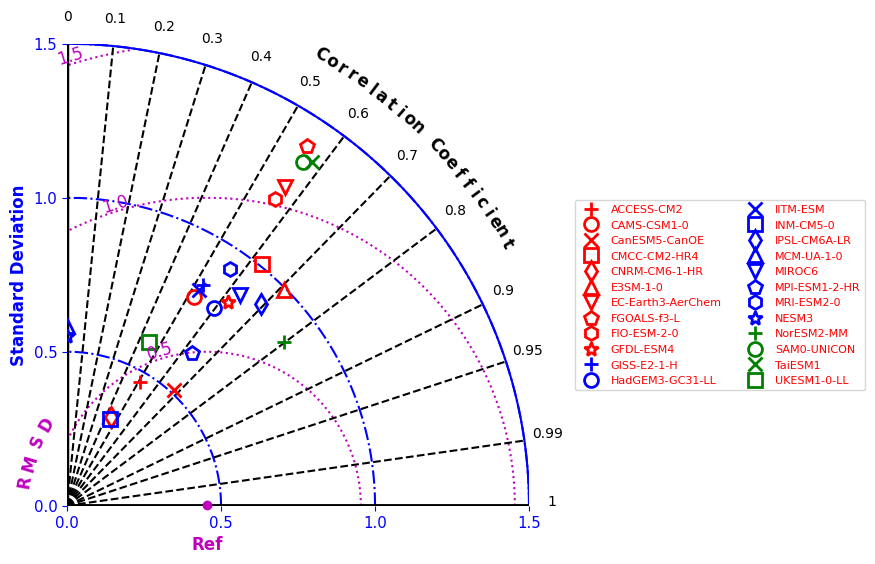

In [29]:
fig, ax = plt.subplots(figsize=(15, 6))
sm.taylor_diagram(stds, rmsds, max_corrs, markerLabel = labels, markerLegend = 'on',
                  markerLabelColor = 'r', 
                  colRMS = 'm', styleRMS = ':', 
                  colSTD = 'b', styleSTD = '-.', 
                  colCOR = 'k', styleCOR = '--',
                 markerobs = 'o', titleOBS = 'Ref',
                  titleSTD ='on',
                 alpha = 0)

In [30]:
for i, key in enumerate(labels):
    print(f"Max Correlation in Model {key} - {round(max_corrs[i], 2)}")

Max Correlation in Model Baseline - 0.77
Max Correlation in Model ACCESS-CM2 - 0.51
Max Correlation in Model CAMS-CSM1-0 - 0.52
Max Correlation in Model CanESM5-CanOE - 0.68
Max Correlation in Model CMCC-CM2-HR4 - 0.63
Max Correlation in Model CNRM-CM6-1-HR - 0.44
Max Correlation in Model E3SM-1-0 - 0.71
Max Correlation in Model EC-Earth3-AerChem - 0.56
Max Correlation in Model FGOALS-f3-L - 0.56
Max Correlation in Model FIO-ESM-2-0 - 0.56
Max Correlation in Model GFDL-ESM4 - 0.62
Max Correlation in Model GISS-E2-1-H - 0.52
Max Correlation in Model HadGEM3-GC31-LL - 0.6
Max Correlation in Model IITM-ESM - 0.52
Max Correlation in Model INM-CM5-0 - 0.44
Max Correlation in Model IPSL-CM6A-LR - 0.69
Max Correlation in Model MCM-UA-1-0 - 0.0
Max Correlation in Model MIROC6 - 0.63
Max Correlation in Model MPI-ESM1-2-HR - 0.63
Max Correlation in Model MRI-ESM2-0 - 0.57
Max Correlation in Model NESM3 - 0.0
Max Correlation in Model NorESM2-MM - 0.8
Max Correlation in Model SAM0-UNICON - 0.57
Ma

Lets look at the correlation diffs to see how they compare to the baseline.

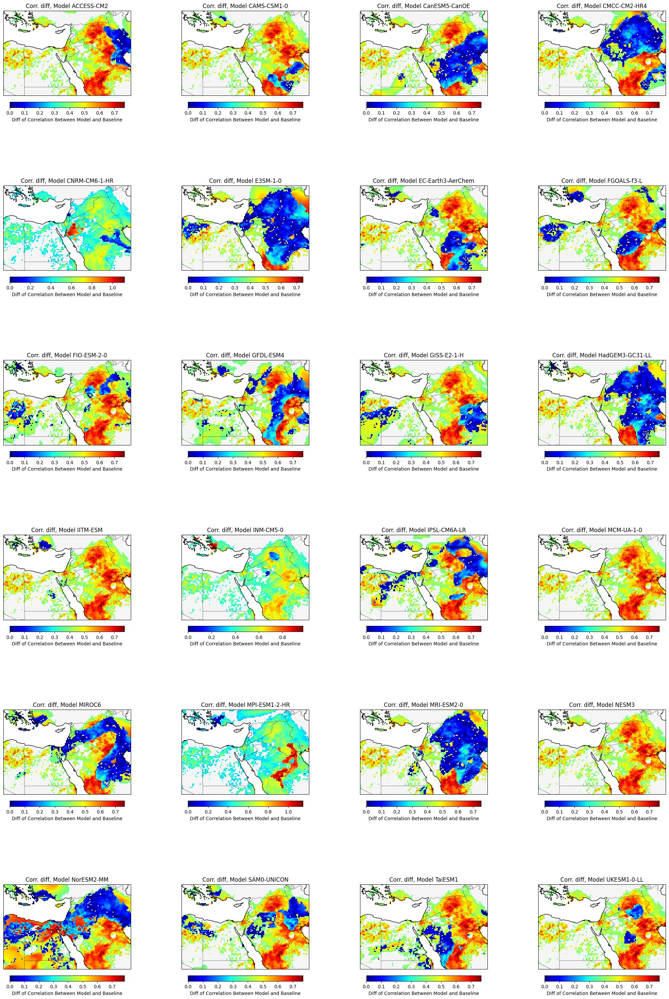

In [31]:
fig4, axes4 = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig4.tight_layout()
mats = [np.abs(tested_corr_baseline - arr) for arr in list(tested_corrs.values())]
titles = list(tested_corrs.keys())

for i, (ax, key, value) in enumerate(zip(axes4.ravel(), titles, mats)):
    vis_helper.plot_precp_heatmap(ax, value, boundaries_middle_east, 'Diff of Correlation Between Model and Baseline', f'Corr. diff, Model {key}', 0)

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

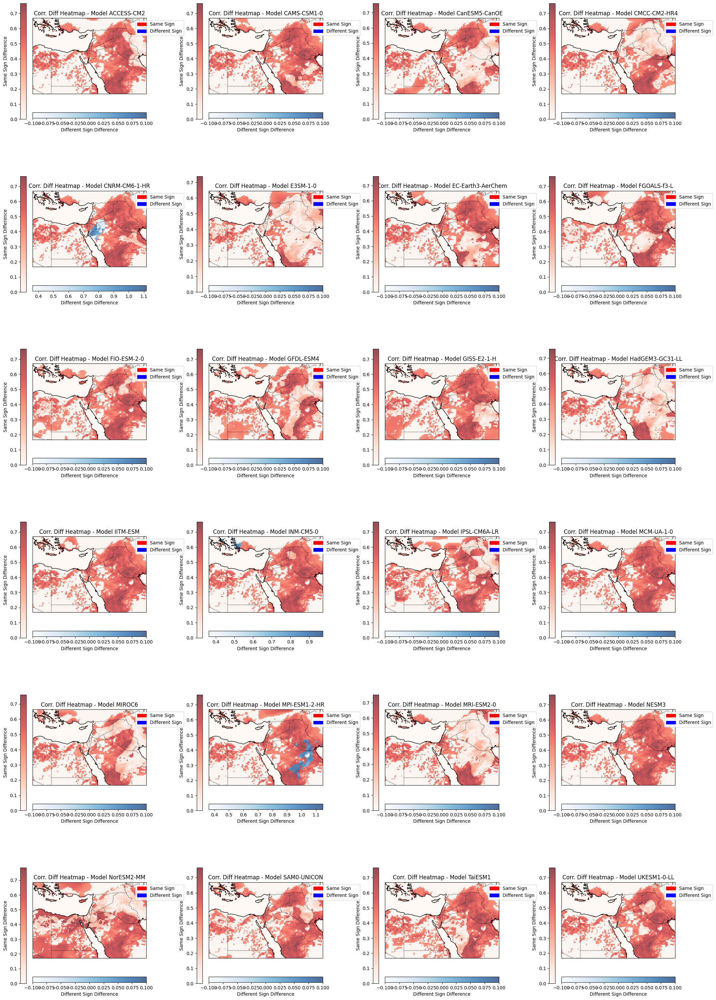

In [32]:
fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats, titles = helper.create_corr_diff_mats(tested_corr_baseline, tested_corrs)

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_corr_diff(ax, value[0], value[1], boundaries_middle_east, label='Difference', title=f'Corr. Diff Heatmap - Model {key}')
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

# DMI POS/NEG Effect on Precipitation

In the next part we will check if Positive DMI actually creates more rainfall.
We will begin by marking each DMI year as either positive or negative.

In [33]:
dmi_pos_neg = {key: np.where(dmi_arr >= 0, True, False) for key, dmi_arr in dmi.items()}

In [34]:
precip_diff_dmi = dict()
for key in tqdm.tqdm(masked_precip.keys()):
    diff_mat = helper.calc_iod_precp_effect(dmi_pos_neg[key], masked_precip[key])
    precip_diff_dmi[key] = diff_mat

100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 234.44it/s]


In [35]:
diff_range_precip = vis_helper.get_diff_range(precip_diff_dmi)

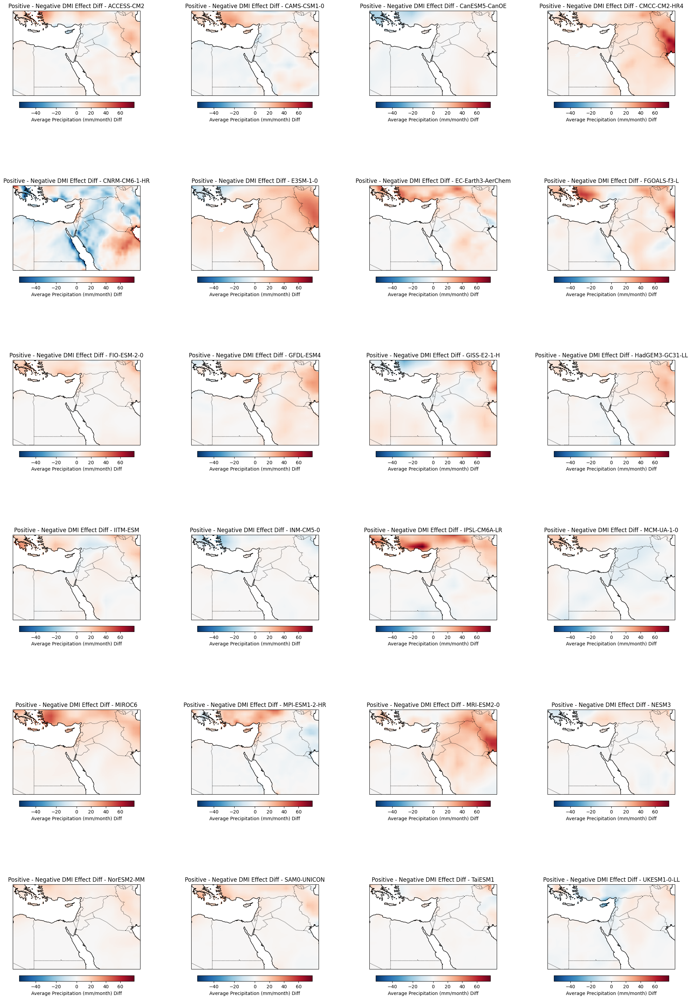

In [36]:
fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(precip_diff_dmi.values())
titles = list(precip_diff_dmi.keys())

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_precp_heatmap(ax, value, boundaries, 'Average Precipitation (mm/month) Diff', f'Positive - Negative DMI Effect Diff - {key}', 0)
    vis_helper.plot_diff_heatmap(ax, value, boundaries_middle_east, 'Average Precipitation (mm/month) Diff', f'Positive - Negative DMI Effect Diff - {key}', diff_range_precip)
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

In [37]:
# wtio_pos_neg = {key: np.where(dmi_arr >= 0, True, False) for key, dmi_arr in wtio.items()}

In [38]:
# precip_diff_wtio = dict()
# for key in tqdm.tqdm(masked_precip.keys()):
#     diff_mat = helper.calc_iod_precp_effect(wtio_pos_neg[key], masked_precip[key])
#     precip_diff_wtio[key] = diff_mat

In [39]:
# fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
# fig.tight_layout()
# mats = list(precip_diff_wtio.values())
# titles = list(precip_diff_wtio.keys())

# for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_precp_heatmap(ax, value, boundaries, 'Average Precipitation (mm/month) Diff', f'Positive - Negative WTIO Effect Diff - {key}', 0)
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
# plt.show()

# DMI POS/NEG Effect on MSLP & GPH 500 

In [40]:
slp = helper.collect_all_datasets(SLP_path, 'slp')
gph = helper.collect_all_datasets(GPH500_path, 'gph500')

 12%|██████████▌                                                                         | 3/24 [00:00<00:00, 27.18it/s]

psl_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
psl_Amon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
psl_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
psl_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
psl_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc


 38%|███████████████████████████████▌                                                    | 9/24 [00:00<00:00, 22.57it/s]

psl_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190913.nc
psl_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
psl_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
psl_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191115.nc
psl_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc


 62%|███████████████████████████████████████████████████▉                               | 15/24 [00:00<00:00, 23.44it/s]

psl_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
psl_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
psl_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
psl_Amon_MCM-UA-1-0_historical_r1i1p1f2_gn_19811017-20101017_v20190731.nc
psl_Amon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc


 75%|██████████████████████████████████████████████████████████████▎                    | 18/24 [00:00<00:00, 17.10it/s]

psl_Amon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
psl_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_19811016-20101016_v20190222.nc
psl_Amon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190630.nc
psl_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc


100%|███████████████████████████████████████████████████████████████████████████████████| 24/24 [00:01<00:00, 20.03it/s]

psl_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
psl_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc
psl_Amon_UKESM1-0-LL_historical_r13i1p1f2_gn_19811016-20101016_v20190406.nc
zg_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
zg_Amon_IPSL-CM6A-LR_historical_r1i1p1f1_gr_19811016-20101016_v20180803.nc



 13%|██████████▉                                                                         | 3/23 [00:00<00:00, 27.10it/s]

zg_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
zg_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
zg_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
zg_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc
zg_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20191220.nc


 39%|████████████████████████████████▊                                                   | 9/23 [00:00<00:00, 22.23it/s]

zg_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
zg_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
zg_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191205.nc
zg_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
zg_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc


 70%|█████████████████████████████████████████████████████████▋                         | 16/23 [00:00<00:00, 25.08it/s]

zg_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
zg_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
zg_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
zg_Amon_IPSL-CM6A-LR_historical_r1i1p1f1_gr_19811016-20101016_v20180803.nc
zg_Amon_MCM-UA-1-0_historical_r1i1p1f2_gn_19811017-20101017_v20190731.nc
zg_Amon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20190311.nc


 87%|████████████████████████████████████████████████████████████████████████▏          | 20/23 [00:00<00:00, 25.77it/s]

zg_Amon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
zg_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_19811016-20101016_v20190308.nc
zg_Amon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190630.nc
zg_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
zg_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
zg_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc


100%|███████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 25.04it/s]

zg_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190406.nc


In [41]:
def slp_process(slp):
    slp_p = dict()
    for key in slp.keys():
        if 'psl' in slp[key].variables.keys():
            slp_p[key] = slp[key]['psl'][:]
        else:
            slp_p[key] = np.squeeze(slp[key]['zg'][:], axis=1)
    return slp_p

def gph_process(gph):
    gph_p = dict()
    for key in gph.keys():
        gph_p[key] = np.squeeze(gph[key]['zg'][:], axis=1)
    return gph_p

def calc_iod_slp_effect(iod_pos_neg, slp):
    pos = np.mean(slp[iod_pos_neg], axis=0)
    neg = np.mean(slp[~iod_pos_neg], axis=0)
    return pos - neg

def calc_iod_gph_effect(iod_pos_neg, gph):
    pos = np.mean(gph[iod_pos_neg], axis=0)
    neg = np.mean(gph[~iod_pos_neg], axis=0)
    return pos - neg


In [42]:
slp = slp_process(slp)
gph = gph_process(gph)

In [43]:
slp_effect = dict()
for key in tqdm.tqdm(slp.keys()):
    diff_mat = helper.calc_iod_slp_effect(dmi_pos_neg[key], slp[key])
    slp_effect[key] = diff_mat

100%|█████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 1310.57it/s]


In [44]:
diff_range_slp = vis_helper.get_diff_range(slp_effect)

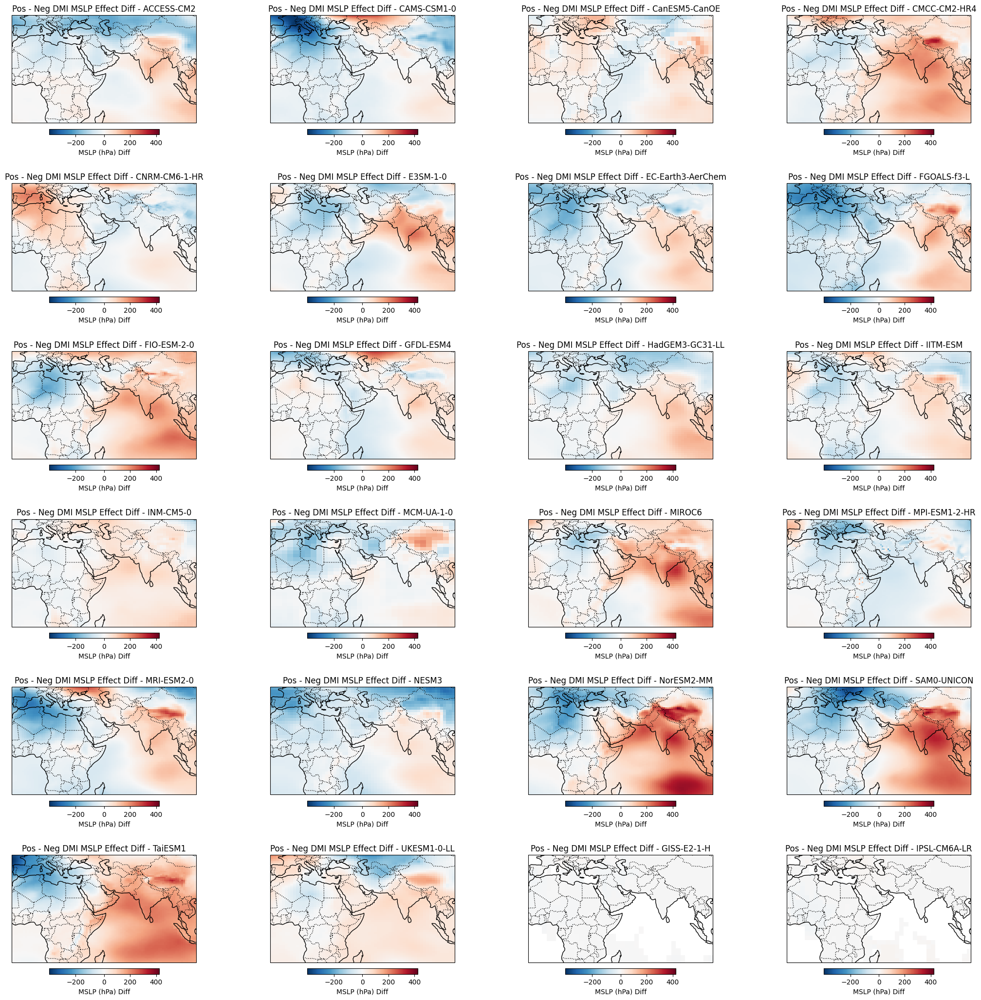

In [45]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(slp_effect.values())
titles = list(slp_effect.keys())

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_precp_heatmap(ax, value, boundaries, 'Average Precipitation (mm/month) Diff', f'Positive - Negative DMI Effect Diff - {key}', 0)
    vis_helper.plot_diff_heatmap(ax, value, boundaries_general, 'MSLP (hPa) Diff', f'Pos - Neg DMI MSLP Effect Diff - {key}', diff_range_slp)
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

In [46]:
gph_effect = dict()
for key in tqdm.tqdm(gph.keys()):
    diff_mat = helper.calc_iod_gph_effect(dmi_pos_neg[key], gph[key])
    gph_effect[key] = diff_mat

100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 541.82it/s]


In [47]:
diff_range_gph = vis_helper.get_diff_range(gph_effect)

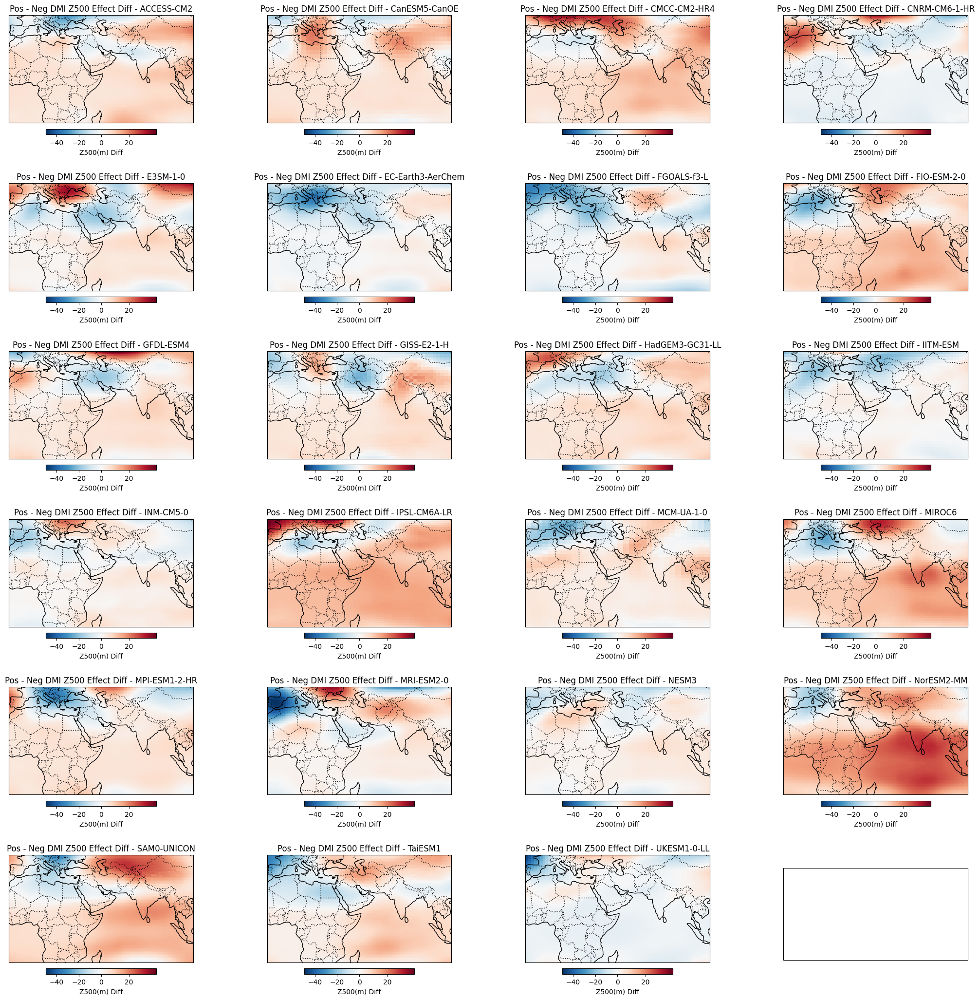

In [48]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(gph_effect.values())
titles = list(gph_effect.keys())

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_precp_heatmap(ax, value, boundaries, 'Average Precipitation (mm/month) Diff', f'Positive - Negative DMI Effect Diff - {key}', 0)
    vis_helper.plot_diff_heatmap(ax, value, boundaries_general, 'Z500(m) Diff', f'Pos - Neg DMI Z500 Effect Diff - {key}', diff_range_gph)
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

# SAL Scores

First, lets look at the sal scores for the correlations

In [49]:
sal_scores = dict()
for key, value in tested_corrs.items():
    scores = pysteps.verification.salscores.sal(value, tested_corr_baseline) # TODO - examine threshold choice
    sal_scores[key] = scores
    print(f'{key} - {scores}')

ACCESS-CM2 - (-1.0617486873936575, -1.520830511463023, 0.49843913205095847)
CAMS-CSM1-0 - (-1.6993949905065577, -1.6864576846415686, 0.18255943647829428)
CanESM5-CanOE - (-0.4202218184493643, -0.6951213048507617, 0.15639188024056372)
CMCC-CM2-HR4 - (-0.2535046459732138, -0.6605857716547416, 0.3207002370774077)
CNRM-CM6-1-HR - (-1.6355553658828808, -2.0392710235173133, 3.264863774367036)
E3SM-1-0 - (0.2167667137199152, -0.1817808579872909, 0.26035833298762057)
EC-Earth3-AerChem - (-0.9357647680059076, -1.2206815066309438, 0.10826120595720026)
FGOALS-f3-L - (-1.4256943053712061, -1.0586266565604954, 0.4109505302510011)
FIO-ESM-2-0 - (-1.2832941824116355, -1.1445163734581045, 0.4999761560880087)
GFDL-ESM4 - (-1.0778498608369729, -0.6584651021493608, 0.2058515743735943)
GISS-E2-1-H - (-0.9537017468261217, -0.8541317110847491, 0.5064094784199719)
HadGEM3-GC31-LL - (0.15750338386507967, -0.4842322499271603, 0.3739298882784794)
IITM-ESM - (-1.7624015164965683, -1.7902345655898997, 0.422056904

In [55]:
pip install adjustText


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: /root/.pyenv/versions/3.10.11/envs/dsproj/bin/python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [56]:
from adjustText import adjust_text


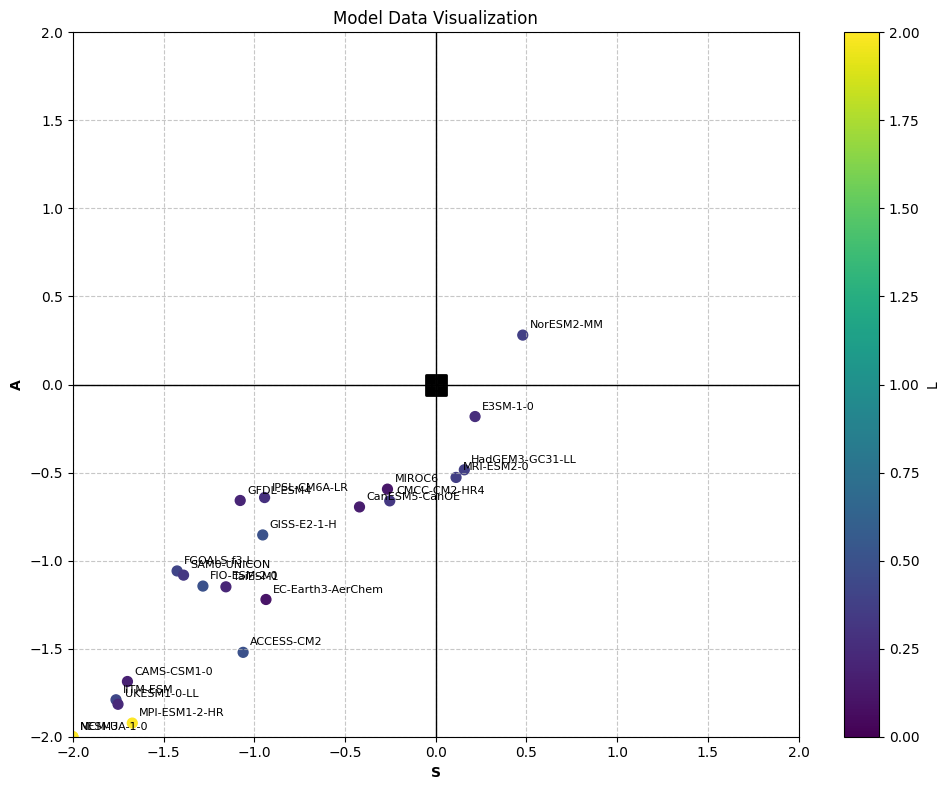

In [60]:
models = list(sal_scores.keys())
data = list(sal_scores.values())

# Separate the data into S, A, and L
S, A, L = zip(*data)
# replace nan values
L = [x if not np.isnan(x) else 2 for x in L]

# Create the scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(S, A, c=L, cmap='viridis', vmin=0, vmax=2, s=50)
plt.scatter(0, 0, marker='s', s=200, c='k', linewidths=2, label='(0, 0)')

# Set the axis limits
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.axhline(0, color='k', linewidth=1)
plt.axvline(0, color='k', linewidth=1)

# Add labels and title
plt.xlabel('S', fontweight='bold')
plt.ylabel('A', fontweight='bold')
plt.title('Model Data Visualization')

# Add a color bar
cbar = plt.colorbar(scatter)
cbar.set_label('L')

# Add a legend
for i, model in enumerate(models):
    plt.annotate(model, (S[i], A[i]), xytext=(5, 5), textcoords='offset points', fontsize=8)

    
# Add grid lines
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

Next, lets look at avg sal scores for each model based on precipitation

In [51]:
# sal_scores = dict()
# for key, value in precip.items():
#     # Itereate over each year, calc SAL, then average each of the S.A.L components for an average score
#     scores = pysteps.verification.salscores.sal(value, tested_corr_baseline) # TODO - examine threshold choice
#     sal_scores[key] = scores
#     print(f'{key} - {scores}')